# Single-cell Transcriptomics Demo

In [1]:
import sys
import scanpy as sc
import os
import torch

sys.path.append(os.path.abspath(".."))

import src.FRLC as FRLC
import src.FRLC.FRLC_multimarginal as FRLC_multimarginal
import src.HiddenMarkovOT as HiddenMarkovOT

import src.utils.util_LR as util_LR
from src.utils.util_LR import convert_adata
util_LR.seed_everything(42)

### Dataset

For this demo, we load the dataset of **Shendure et al. (2024)**  
([Nature article](https://www.nature.com/articles/s41586-024-07069-w)),  
a large-scale single-cell RNA-seq atlas spanning mouse embryogenesis.

We use:

- An `AnnData` object containing transcriptomic profiles:
  [adata_JAX_dataset_1.h5ad](https://shendure-web.gs.washington.edu/content/members/cxqiu/public/backup/jax/download/adata/adata_JAX_dataset_1.h5ad)

- A **cell-type annotation table**:
  [df_cell.csv](https://shendure-web.gs.washington.edu/content/members/cxqiu/public/backup/jax/download/adata/df_cell.csv)

In the cell below, we do some simple processing. We load the dataset, integrate the published cell-types, and take a subset of timepoints and replicates to look at.

In [2]:
import pandas as pd

# Loading the Shendure et al 2024 dataset 
filehandle_ME = f'/scratch/gpfs/ph3641/hm_ot/adata_JAX_dataset_1.h5ad'

timepoints =  ['E8.5', 'E8.75', 'E9.0', 'E9.25']
replicates =  ['embryo_11', 'embryo_14', 'embryo_16', 'embryo_20']

adata = sc.read_h5ad(filehandle_ME, backed="r")

# Filter to subset of interest
subset_adata = adata[
                    (adata.obs['day'].isin(timepoints)) & 
                    (adata.obs['embryo_id'].isin(replicates))
                ]

# Load cell-type annotations
df_cell = pd.read_csv("/scratch/gpfs/ph3641/hm_ot/df_cell.csv")
df_cell = df_cell.set_index("cell_id")

# Joining the metadata
subset_adata = subset_adata.to_memory()
subset_adata.obs = subset_adata.obs.set_index("cell_id")
subset_adata.obs = subset_adata.obs.join(df_cell[['celltype_update']], how="left")

# Preprocessing: normalize, log-transform, PCA
sc.pp.normalize_total(subset_adata, target_sum=1e4)
sc.pp.log1p(subset_adata)
sc.pp.pca(subset_adata, n_comps=30)


### Running HM-OT

Now that we’ve constructed an `AnnData` object containing:

- The **replicates** of interest (in `.obs['embryo_id']`)
- The **timepoints** of interest (in `.obs['day']`)
- **Lower-dimensional features** for cost computation (in `.obsm['X_pca']`)
- Optional **cell-type annotations** (in `.obs['celltype_update']`)

...we're ready to run **Hidden Markov Optimal Transport (HM-OT)**!

Since this is a single-cell transcriptomics dataset, we set `spatial=False`.  
We specify two key parameters for the low-rank approximation of the pairwise distance matrices:

- `dist_rank` — controls the rank of the approximation
- `dist_eps` — sets the error tolerance for the approximation

Lowering `dist_rank` or increasing `dist_eps` makes the distance matrix more memory-efficient, at the cost of approximation accuracy.

Running `convert_adata` prepares the inputs to **HM-OT**.  
We then initialize `HiddenMarkovOT.HM_OT` with the desired hyperparameters and run `impute_annotated_transitions` to infer the differentiation maps across timepoints.

The underlying low-rank optimal transport solver (in `src/FRLC`) used by HM-OT is based on the framework introduced in:

> Halmos, P., Liu, X., Gold, J., and Raphael, B. (2024).  
> [Low-Rank Optimal Transport through Factor Relaxation with Latent Coupling](https://proceedings.neurips.cc/paper_files/paper/2024/file/cfc1924c62e72e2cb0e0feeecb963241-Paper-Conference.pdf), NeurIPS 2024.

This solver enables scalable inference of optimal transport plans and transition maps even for large single-cell datasets.

Computing low-rank distance matrix!
Computing low-rank distance matrix!
Computing low-rank distance matrix!
Iteration: 0
Iteration: 0
Iteration: 0


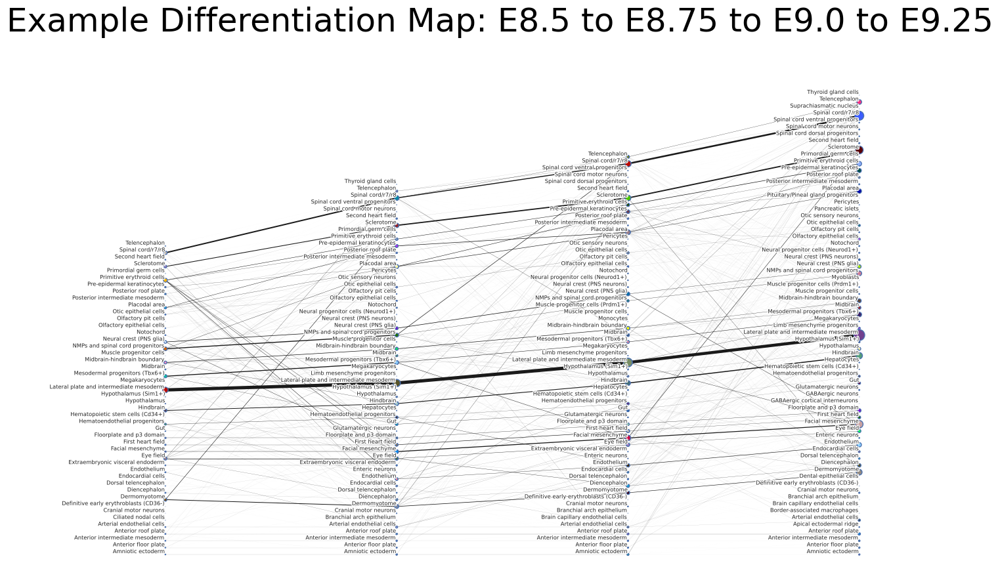

In [3]:
import src.plotting as plotting

# Set torch device (GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Convert AnnData in HM-OT ready factors
C_factors_sequence, A_factors_sequence, Qs, labels, rank_list, _spatial_list = convert_adata(subset_adata,
                                                                              replicates=replicates,
                                                                              timepoints=timepoints,
                                                                                timepoint_key = 'day', 
                                                                                  replicate_key = 'embryo_id',
                                                                                  feature_key = 'X_pca',
                                                                                    cell_type_key = 'celltype_update',
                                                                                    spatial = False,
                                                                                    dist_eps = 0.03,
                                                                                    dist_rank = 100, 
                                                                                    device = device)

# Initialize HM-OT with hyperparameters, set printCost = True to see progress on loss
hmot = HiddenMarkovOT.HM_OT(rank_list,
                            tau_in = 1e-5,
                            tau_out=5,
                            gamma=5,
                            max_iter=20,
                            min_iter=20,
                            device=device,
                            dtype=torch.float32,
                             printCost=False,
                            returnFull=False,
                            initialization='Full'
                            )

# Run HM-OT to infer annotated transitions
hmot.impute_annotated_transitions(C_factors_sequence, A_factors_sequence, Qs)

# We can now load the transitions and annotated cell-types
Ts_ann = [T.cpu().numpy() for T in hmot.T_gammas]
Qs_ann = [Q.cpu().numpy() for Q in Qs]

# Visualize the inferred differentiation map
plotting.diffmap_from_QT(Qs_ann, Ts_ann, labels, dsf=0.01, fontsize=6, linethick_factor=20, \
                         title= f'Example Differentiation Map: {timepoints[0]} to {timepoints[1]} to {timepoints[2]} to {timepoints[3]}',
                        save_name = os.path.join("/scratch/gpfs/ph3641/hm_ot/ME_supervised_figs/example_diff_map.png" ))



### Scaling HM-OT Across Larger Datasets

For large-scale single-cell datasets, computing a joint PCA across all timepoints and replicates may be infeasible due to memory constraints.

Fortunately, when transitions are computed between **fixed cell-type annotations**, we can safely perform supervised HM-OT on **consecutive pairs of timepoints**. This allows us to scale the analysis linearly across the developmental timeline.

Below, we iterate over consecutive pairs of timepoints and replicates, process each pair with its own PCA, and stitch together the resulting transition maps and clusterings into a global differentiation map.

-----Starting PCA for E8.5 to E8.75-----
-----PCA done!-----
Number of cell-types (ranks) — E8.5: 46, E8.75: 55 → using rank: 100 for distance matrix
Computing low-rank distance matrix!
Iteration: 0
-----Starting PCA for E8.75 to E9.0-----
-----PCA done!-----
Number of cell-types (ranks) — E8.75: 55, E9.0: 59 → using rank: 100 for distance matrix
Computing low-rank distance matrix!
Iteration: 0
-----Starting PCA for E9.0 to E9.25-----
-----PCA done!-----
Number of cell-types (ranks) — E9.0: 59, E9.25: 68 → using rank: 100 for distance matrix
Computing low-rank distance matrix!
Iteration: 0
-----Starting PCA for E9.25 to E9.5-----
-----PCA done!-----
Number of cell-types (ranks) — E9.25: 68, E9.5: 81 → using rank: 100 for distance matrix
Computing low-rank distance matrix!
Iteration: 0
-----Starting PCA for E9.5 to E9.75-----
-----PCA done!-----
Number of cell-types (ranks) — E9.5: 81, E9.75: 90 → using rank: 100 for distance matrix
Computing low-rank distance matrix!
Iteration: 0
-----

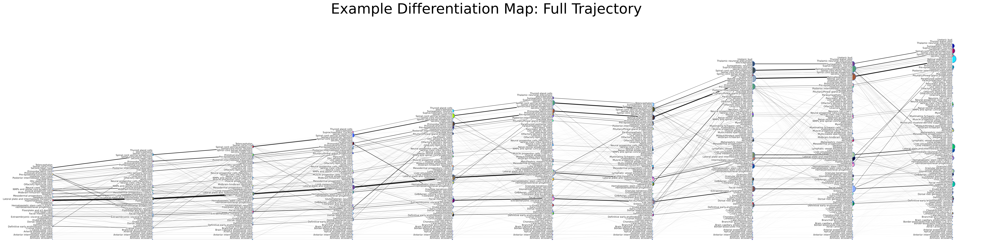

In [4]:
# Define the full developmental trajectory and replicates
timepoints = ['E8.5', 'E8.75', 'E9.0', 'E9.25', 'E9.5', 'E9.75', 'E10.0', 'E10.25', 'E10.5', 'E10.75']
replicates = ['embryo_11', 'embryo_14', 'embryo_16', 'embryo_20', 'embryo_24', 'embryo_28', 
              'embryo_30', 'embryo_33', 'embryo_34', 'embryo_35']

adata = sc.read_h5ad(filehandle_ME, backed="r")

Ts = []
Qs = []
labels = []

for tp in range(len(timepoints) - 1):
    
    t1 = timepoints[tp]
    t2 = timepoints[tp+1]

    r1 = replicates[tp]
    r2 = replicates[tp+1]
    
    # Filter AnnData to two timepoints/replicates of interest
    subset_adata = adata[
            (adata.obs['day'].isin(timepoints[tp:tp+2])) & 
            (adata.obs['embryo_id'].isin(replicates[tp:tp+2]))
        ]

    # Load into memory and merge with cell-type annotations
    subset_adata = subset_adata.to_memory()
    subset_adata.obs = subset_adata.obs.set_index("cell_id")
    subset_adata.obs = subset_adata.obs.join(df_cell[['celltype_update']], how="left")
    
    print(f'-----Starting PCA for {t1} to {t2}-----')
    sc.pp.normalize_total(subset_adata, target_sum=1e4)  # Normalize per cell
    sc.pp.log1p(subset_adata)
    sc.pp.pca(subset_adata, n_comps=30)
    print('-----PCA done!-----')
    
    tps = [t1, t2]
    rps = [r1, r2]

    # Computing number of annotated cell-types
    rank1 = subset_adata[subset_adata.obs['day'] == t1].obs['celltype_update'].nunique()
    rank2 = subset_adata[subset_adata.obs['day'] == t2].obs['celltype_update'].nunique()
    r_max = max( min(rank1, rank2), 100)
    print(f'Number of cell-types (ranks) — {t1}: {rank1}, {t2}: {rank2} → using rank: {r_max} for distance matrix')

    # Convert to HM-OT input
    C_factors_sequence, A_factors_sequence, _Qs, label_pair, rank_list, _spatial_list = convert_adata(
                subset_adata,
                replicates=rps,
                timepoints=tps,
                timepoint_key = 'day', 
                replicate_key = 'embryo_id',
                feature_key = 'X_pca',
                cell_type_key = 'celltype_update',
                spatial = False,
                dist_eps = 0.03,
                dist_rank = r_max, 
                device = device)

    # Initialize HM-OT
    hmot = HiddenMarkovOT.HM_OT(rank_list, 
                                tau_in = 1e-5, 
                                tau_out=5,
                                gamma=5, 
                                max_iter=20,
                                min_iter=20,
                                device=device,
                                dtype=torch.float32,
                                 printCost=False,
                                returnFull=False,
                                initialization='Full'
                               )

    # Run on the pair
    hmot.impute_annotated_transitions(C_factors_sequence, A_factors_sequence, _Qs)
    
    Ts.append(hmot.T_gammas[0].cpu().numpy())
    if tp == 0:
        Qs.append(_Qs[0].cpu().numpy())
        labels.append(label_pair[0])
    Qs.append(_Qs[1].cpu().numpy())
    labels.append(label_pair[1])


# Visualize the inferred differentiation map
plotting.diffmap_from_QT(Qs, Ts, labels, dsf=0.01, fontsize=6, linethick_factor=20, \
                         title= f'Example Differentiation Map: Full Trajectory',
                        save_name = os.path.join("/scratch/gpfs/ph3641/hm_ot/ME_supervised_figs/example_diff_map_full.png" ))
